# Notes on OCR 

Computer - convert image -> numerical array -> parse by OCR -> raw text   

here, what we learn might not work for _handwritten docs_.  Only typed docs.   

**WORKFLOW**   
PIL(Pillow) -> Open an Image (PIL is Python Imaging Library)   
OpenCV -> Change an Image   
Tesseract(PyTesseract) -> OCR an Image

## Our Documents can have:   
1. tables   
2. indices   
3. footnotes   
4. Subscript/Superscripts  
5. watermark
6. noise or ink splashes
7. combination different languages
8. (;:"{}?>) different marks
9. etc.

In [1]:
#pip install pillow

**Use ' pip install opencv-python ''  in Anaconda prompt**   
then import cv2 in jupyter notebbok, no errors now.   

In [2]:
import cv2

In [3]:
from PIL import Image

#follow video for pytesseract
https://www.youtube.com/watch?v=tQGgGY8mTP0&list=PL2VXyKi-KpYuTAZz__9KVl1jQz74bDG7i

In [4]:
import pytesseract

We use Pillow to load images in memory, to pass them off to pytesseract, store them as temp files.  
OpenCV we use for complex things.   

In [5]:
im_file = 'Dataset/page_01.jpg'

In [6]:
im = Image.open(im_file)

In [7]:
print(im.size)

(1200, 1522)


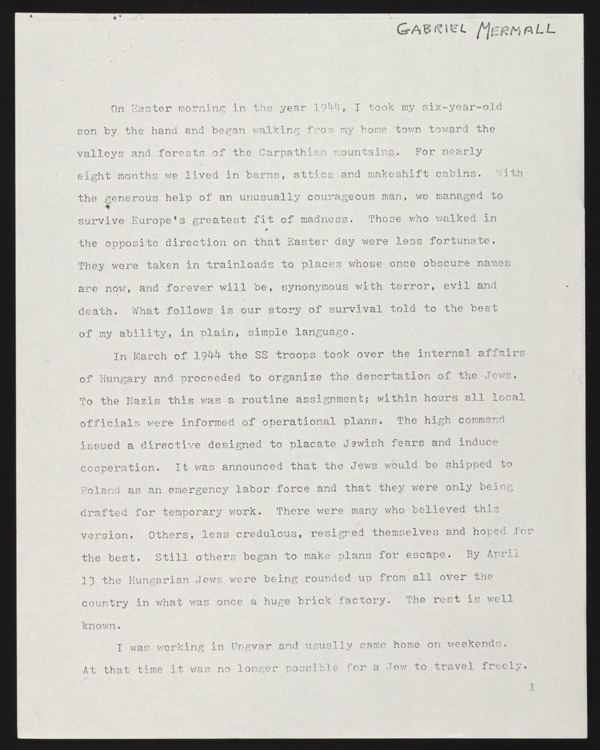

In [8]:
#observe the image for noise, footnotes etc.

#reducing the size,just for display purpose now
display(im.resize(size=(600,750)))

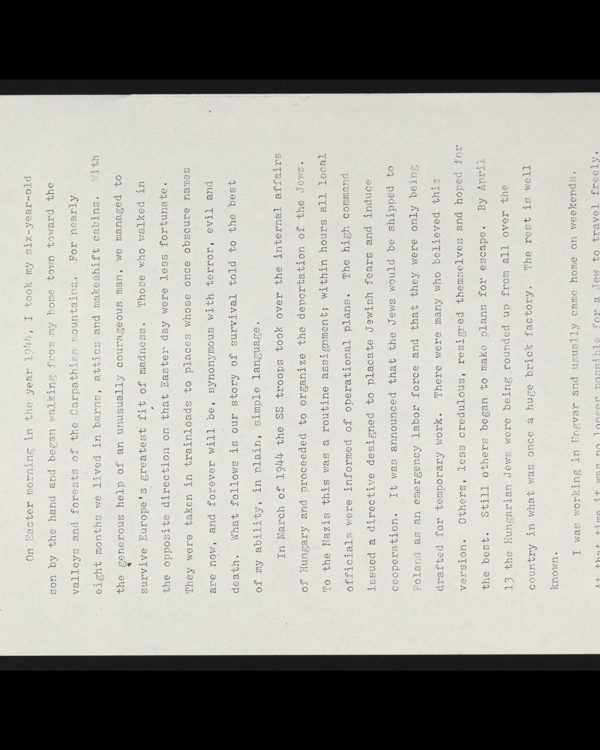

In [9]:
#rotating
im.rotate(90).resize((600,750))

# How to Preprocess images for Text OCR in Python   
You don't need to all the steps shown here. It depends on case basis. Main goal is to get OCR with high accuracy.  

## 0. Opening an Image

In [10]:
import cv2
from matplotlib import pyplot as plt

image_file = 'Dataset/page_01.jpg'
img = cv2.imread(image_file)


In [11]:
#https://stackoverflow.com/questions/28816046/
#displaying-different-images-with-actual-size-in-matplotlib-subplot
def display(im_path):
    dpi = 80
    im_data = plt.imread(im_path)

    height, width  = im_data.shape[:2]
    
    # What size does the figure need to be in inches to fit the image?
    figsize = width / float(dpi), height / float(dpi)

    # Create a figure of the right size with one axes that takes up the full figure
    fig = plt.figure(figsize=figsize)
    ax = fig.add_axes([0, 0, 1, 1])

    # Hide spines, ticks, etc.
    ax.axis('off')

    # Display the image.
    ax.imshow(im_data, cmap='gray')

    plt.show()

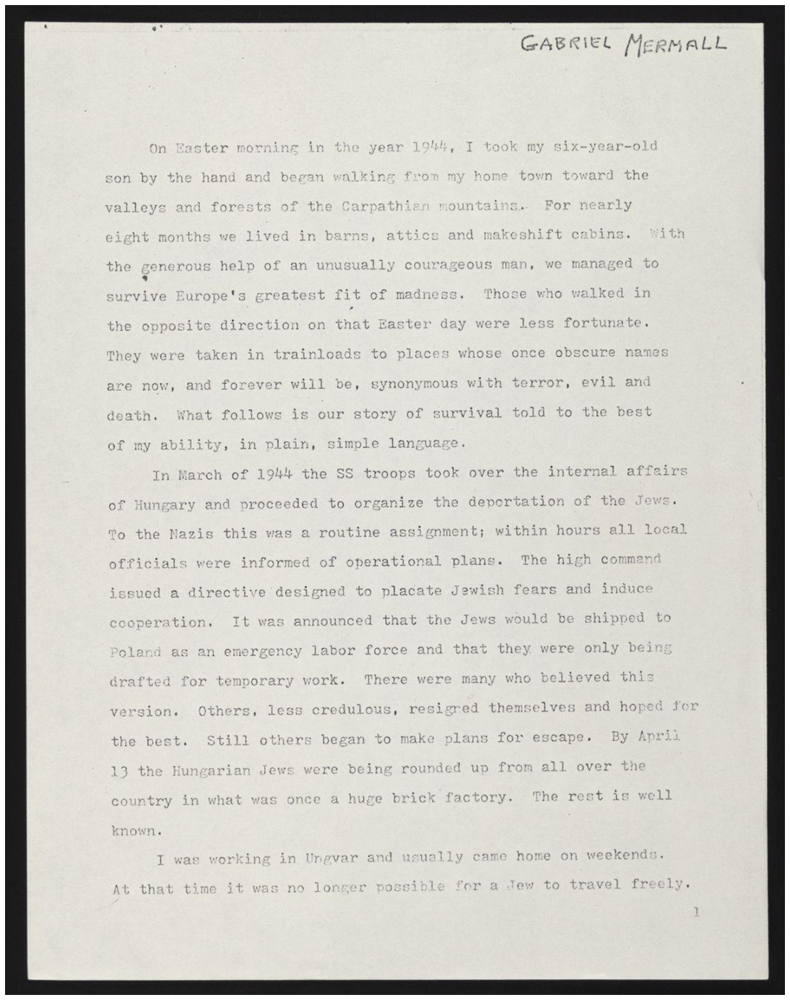

In [12]:
display(image_file)

## 1. Inverted Images (b/w to w/b)   
Not an essential in tesseract 4.0 onwards, probably it does itself for preprpocessing.

In [13]:
inverted_image = cv2.bitwise_not(img)
cv2.imwrite('temp/inverted.jpg',inverted_image)

True

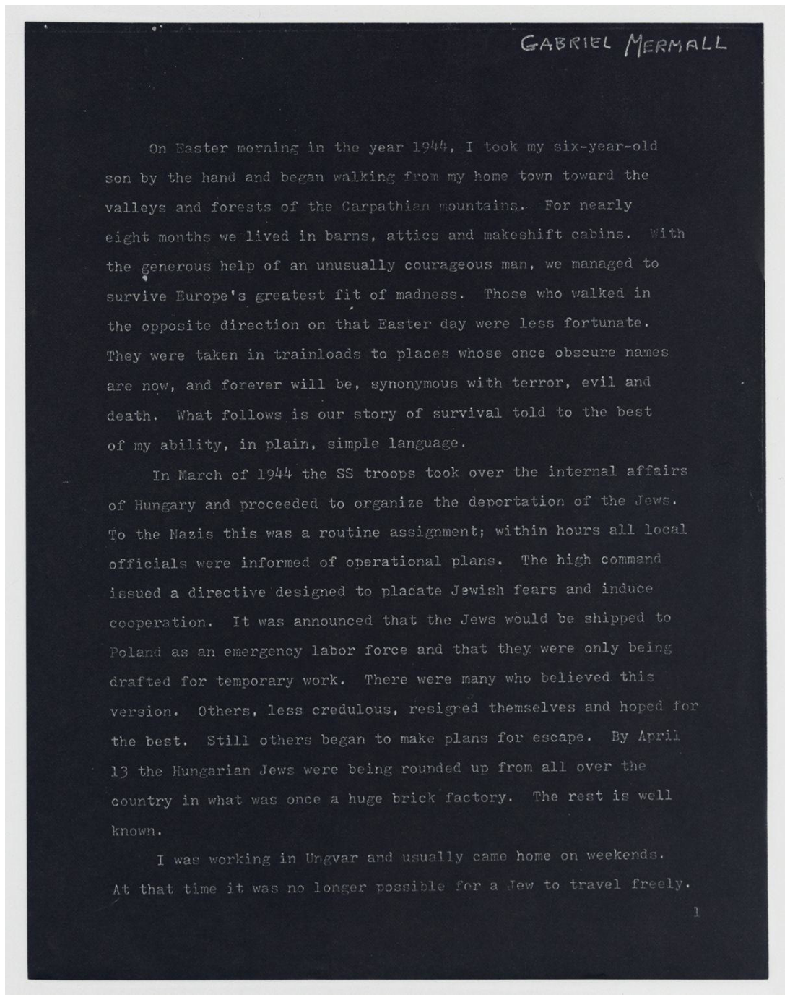

In [14]:
display('temp/inverted.jpg')

## 2. Rescaling

## 3. Binarization   
Convert an image into black and white.   
We convert image first into greyscale and then into B/W.   

In [15]:
def grayscale(image):
    return cv2.cvtColor(image,cv2.COLOR_BGR2GRAY)

In [16]:
gray_image = grayscale(img)
cv2.imwrite('temp/gray.jpg',gray_image)

True

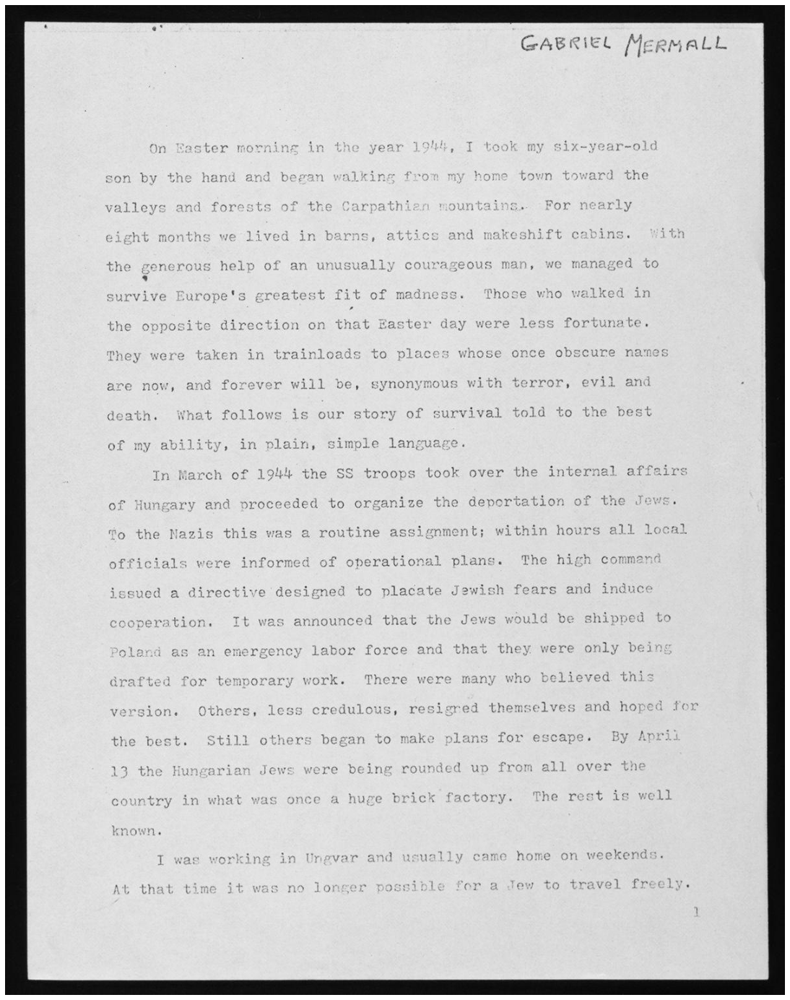

In [17]:
display('temp/gray.jpg')

In [18]:
thresh, im_bw = cv2.threshold(gray_image, 210, 255, cv2.THRESH_BINARY)   #you can adjust parameters 127, 255 to your choice (check using 200,255)
cv2.imwrite('temp/bw_image.jpg', im_bw)

True

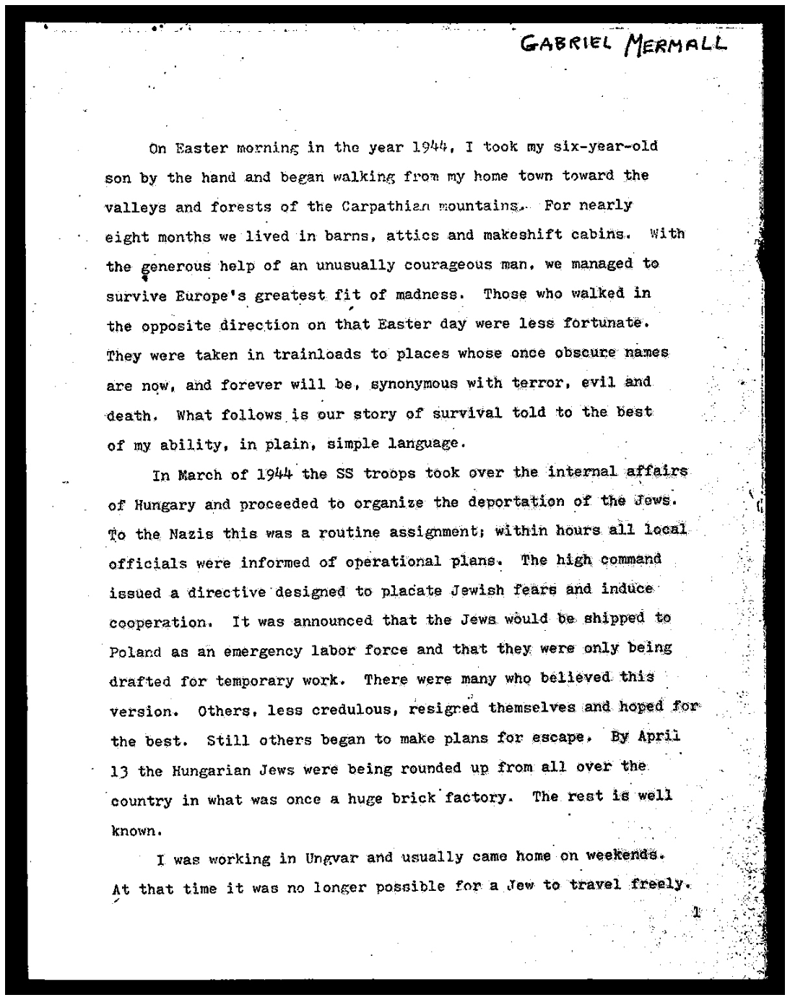

In [19]:
display('temp/bw_image.jpg')

It might be difficult for a human to read (depends on threshold numbers), but might be easy for machine to process further from here.   
These tries to reduce the noise.   
play around the threshold to get best OCR results, may be.

## 4. Noise Removal   
Pixels which do not correspond to text.   
Here, noise around page number 1 (bottom right).   

In [20]:
def noise_removal(image):
    import numpy as np
    kernel = np.ones((1,1),np.uint8)
    image = cv2.dilate(image,kernel,iterations=1)
    kernel = np.ones((1,1),np.uint8)
    image = cv2.erode(image,kernel,iterations=1)
    image = cv2.morphologyEx(image,cv2.MORPH_CLOSE,kernel)
    image = cv2.medianBlur(image,3)
    return (image)

In [21]:
no_noise = noise_removal(im_bw)  #we take binarized image
cv2.imwrite('temp/no_noise.jpg', no_noise)

True

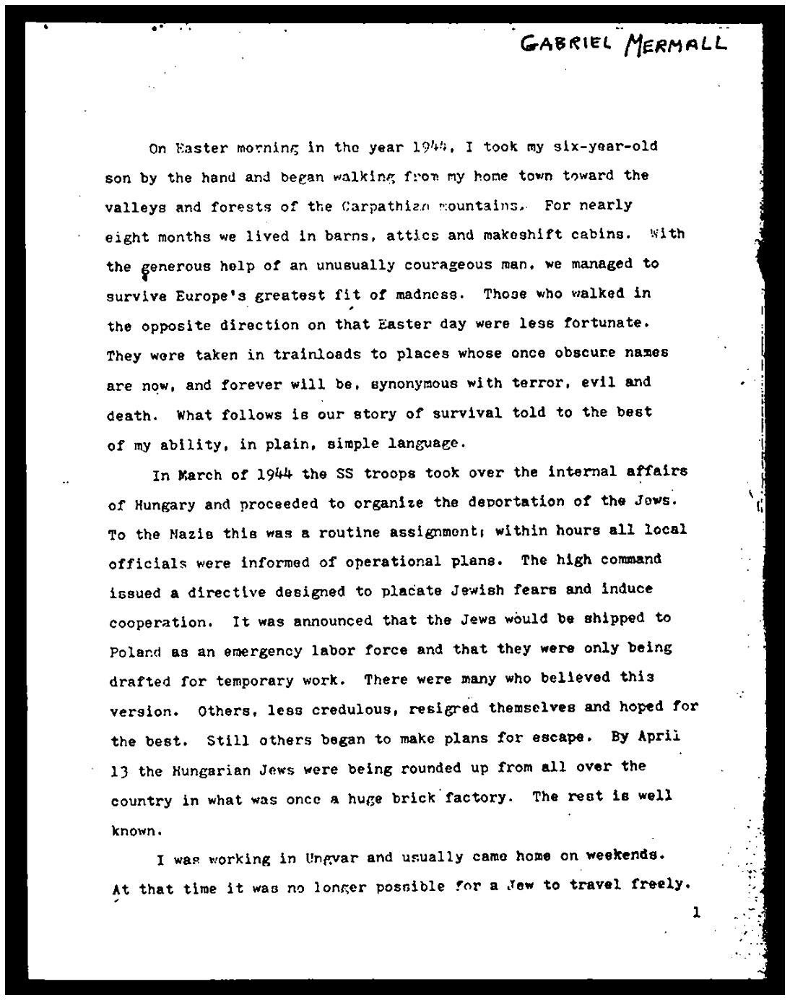

In [22]:
display('temp/no_noise.jpg')

we can see no noise around page number 1 (right bottom) and elsewhere 'but' it gets blurred.

## 5. Dilation and Erosion   
thick letters  
thin letters  
they might throw off ocr results

In [23]:
def thin_font(image):
    import numpy as np # better write at top
    image = cv2.bitwise_not(image)   # making backgroung black and words as white, thats how it works? 
    kernel = np.ones((2,2),np.uint8)
    image = cv2.erode(image,kernel,iterations=1)
    image = cv2.bitwise_not(image)
    return (image)

In [24]:
eroded_image = thin_font(no_noise)
cv2.imwrite('temp/eroded_image.jpg',eroded_image)

True

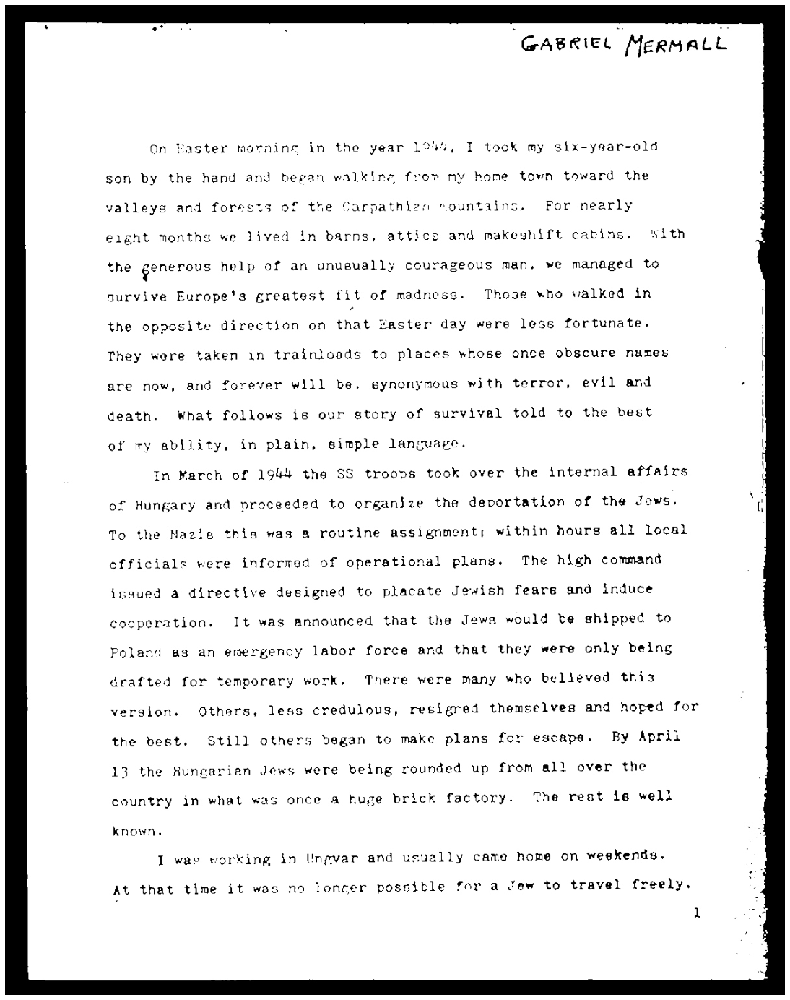

In [25]:
display('temp/eroded_image.jpg')

Font becomes thinner. You can change kernel (2,2) as (3,3) or any. You can change iterarions=2 or any and see the differences.

In [26]:
#thick font
def thick_font(image):
    import numpy as np # better write at top
    image = cv2.bitwise_not(image)   # making backgroung black and words as white, thats how it works? 
    kernel = np.ones((2,2),np.uint8)
    image = cv2.dilate(image,kernel,iterations=1)
    image = cv2.bitwise_not(image)
    return (image)

In [27]:
dilated_image = thick_font(no_noise)
cv2.imwrite('temp/dilated_image.jpg',dilated_image)


True

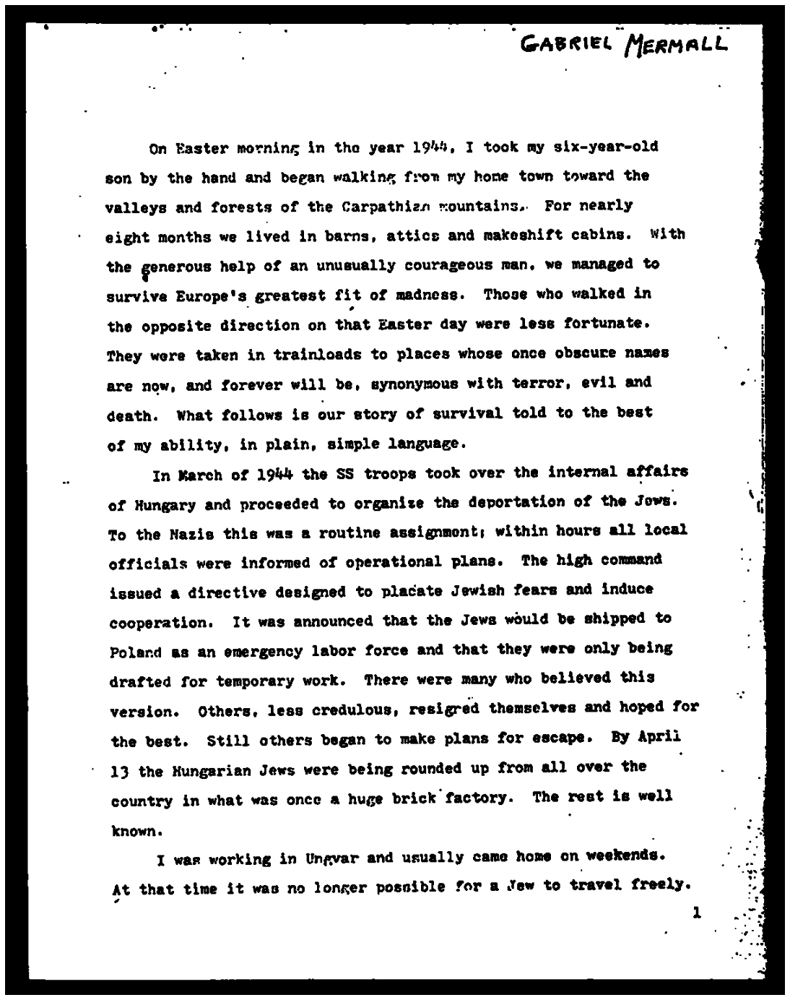

In [28]:
display('temp/dilated_image.jpg')

Not all these steps are necessary. Depends upon problem to problem.  
You can see 1944 in first line in original is not legible but after thick font its good.  

## 6. Rotating / Deskewing  
Important: have no borders. It might not work with borders interfering with alignment or anyother operation.  

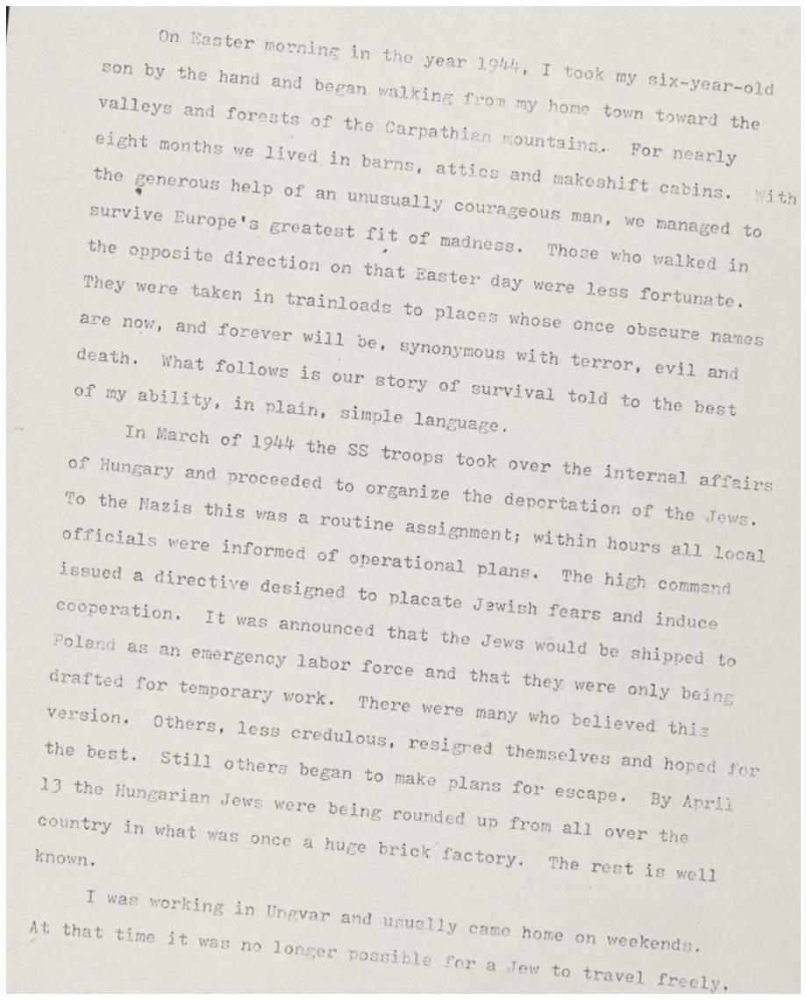

In [29]:
new = cv2.imread('Dataset/page_01_rotated.jpg')
display('Dataset/page_01_rotated.jpg')

In [30]:
#from community help
#https://becominghuman.ai/how-to-automatically-deskew-straighten-a-text-image-using-opencv-a0c30aed83df
import numpy as np

def getSkewAngle(cvImage) -> float:
    # Prep image, copy, convert to gray scale, blur, and threshold
    newImage = cvImage.copy()
    gray = cv2.cvtColor(newImage, cv2.COLOR_BGR2GRAY)
    blur = cv2.GaussianBlur(gray, (9, 9), 0)
    thresh = cv2.threshold(blur, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)[1]

    # Apply dilate to merge text into meaningful lines/paragraphs.
    # Use larger kernel on X axis to merge characters into single line, cancelling out any spaces.
    # But use smaller kernel on Y axis to separate between different blocks of text
    kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (30, 5))
    dilate = cv2.dilate(thresh, kernel, iterations=2)

    # Find all contours
    contours, hierarchy = cv2.findContours(dilate, cv2.RETR_LIST, cv2.CHAIN_APPROX_SIMPLE)
    contours = sorted(contours, key = cv2.contourArea, reverse = True)
    for c in contours:
        rect = cv2.boundingRect(c)
        x,y,w,h = rect
        cv2.rectangle(newImage,(x,y),(x+w,y+h),(0,255,0),2)

    # Find largest contour and surround in min area box
    largestContour = contours[0]
    print (len(contours))
    minAreaRect = cv2.minAreaRect(largestContour)
    cv2.imwrite("temp/boxes.jpg", newImage)
    # Determine the angle. Convert it to the value that was originally used to obtain skewed image
    angle = minAreaRect[-1]
    if angle < -45:
        angle = 90 + angle
    return -1.0 * angle
# Rotate the image around its center
def rotateImage(cvImage, angle: float):
    newImage = cvImage.copy()
    (h, w) = newImage.shape[:2]
    center = (w // 2, h // 2)
    M = cv2.getRotationMatrix2D(center, angle, 1.0)
    newImage = cv2.warpAffine(newImage, M, (w, h), flags=cv2.INTER_CUBIC, borderMode=cv2.BORDER_REPLICATE)
    return newImage

In [31]:
#from community help
# Deskew image
def deskew(cvImage):
    angle = getSkewAngle(cvImage)
    return rotateImage(cvImage, -1.0 * angle)

In [32]:
fixed = deskew(new)
cv2.imwrite('temp/rotated_fixed.jpg',fixed)

28


True

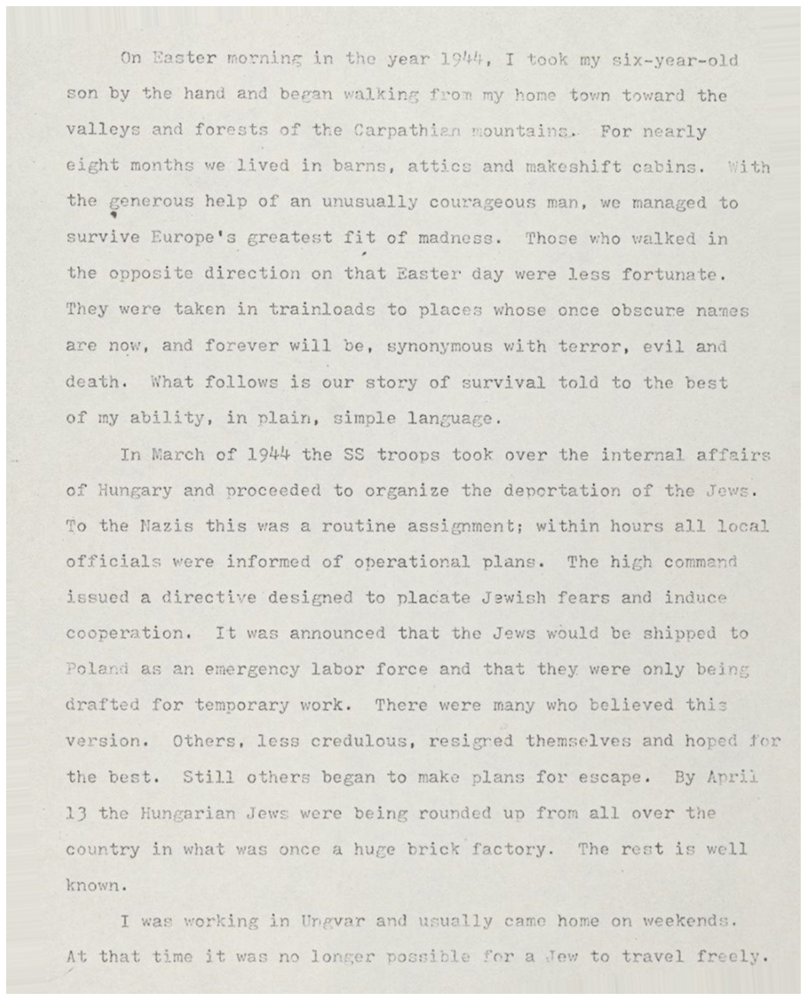

In [33]:
display('temp/rotated_fixed.jpg')

## 7. Removing Borders

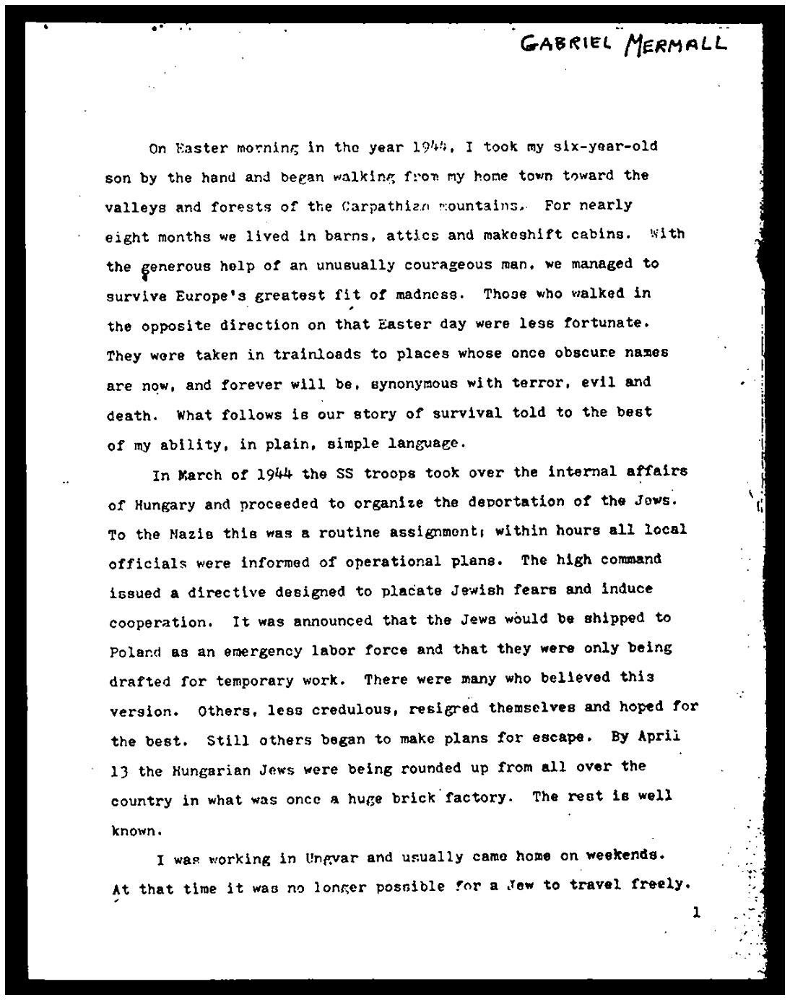

In [34]:
display('temp/no_noise.jpg')

observe black border around the page.

In [35]:
def remove_borders(image):
    contours, heiarchy = cv2.findContours(image,cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    cntsSorted = sorted(contours, key=lambda x:cv2.contourArea(x))
    cnt = cntsSorted[-1]
    x, y, w, h = cv2.boundingRect(cnt)
    crop = image[y:y+h,x:x+w]
    return (crop)

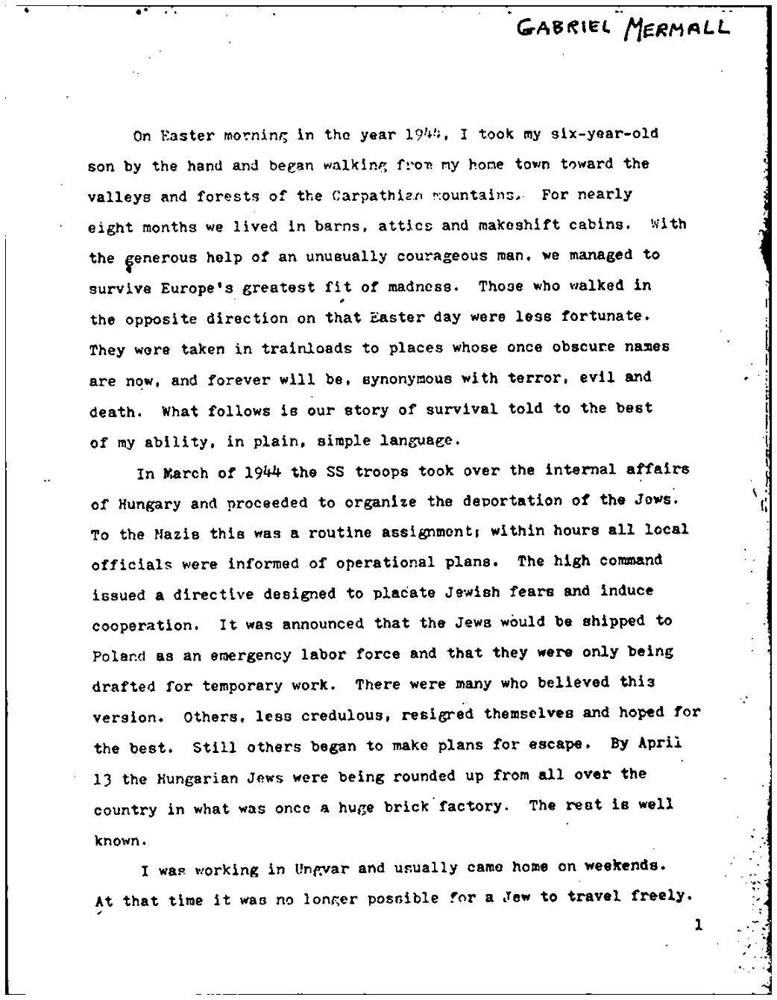

In [36]:
no_borders = remove_borders(no_noise)
cv2.imwrite('temp/no_borders.jpg', no_borders)
display('temp/no_borders.jpg')

There is no black border around the page. Its not so perfect because of noise and non-linear borders in image.

## 8. Missing Borders

In [37]:
#adding white border
color = [255,255,255] #white color
top, bottom, left, right = [150]*4

In [38]:
image_with_border = cv2.copyMakeBorder(no_borders, top, bottom, left, right, cv2.BORDER_CONSTANT, value=color)
cv2.imwrite('temp/image_with_border.jpg',image_with_border)

True

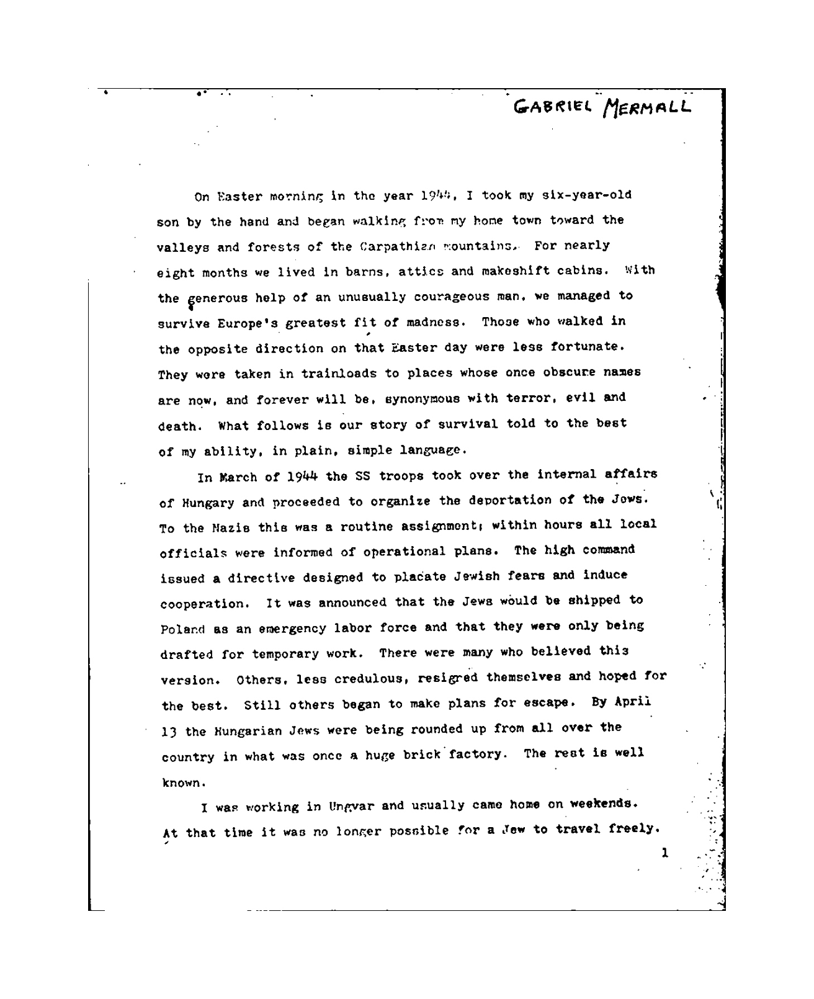

In [39]:
display('temp/image_with_border.jpg')

One can remove borders or add white borders for pre-processing.

# Pytesseract basics

1. receipts
2. single column texts
3. multi-column texts
4. tabular data

In [40]:
import pytesseract
from PIL import Image

In [41]:
img_file = 'Dataset/page_01.jpg'
no_noise = 'temp/no_noise.jpg'

In [42]:
img = Image.open(img_file)

In [43]:
ocr_result = pytesseract.image_to_string(img)

In [44]:
print(ocr_result)

In [45]:
 # We see no output. Because page_01.jpg is not preprocessed. So not allowing pytesseract to process.

In [46]:
# Lets try with no_noise.jpg (which is preprocessed several different layers)
img = Image.open(no_noise)

In [47]:
ocr_result = pytesseract.image_to_string(img)

In [48]:
print(ocr_result)

“GABRIEL Meamall

On Easter morning in the year 194%, I took my six-year-old
son by the hand and began walking fron my home town toward the
valleys and forests of the Carpathi2n mountains. For nearly
eight months we lived in barns, attics and makeshift eabins. With
the generous help of an unusually courageous man, we managed to
survive Europe's greatest fit of madness. Those who walked in
the opposite direction on that Easter day were lese fortunate.
They were taken in trainloads to places whose once obscure names
are now, and forever will be, synonymous with terror, evil and
death. What follows is our story of survival told to the best
of my ability, in plain, simple language.

In March of 1944 the SS troops took over the internal affairs
of Hungary and proceeded to organize the deportation of the dows.
To the Nazie thie was a routine assignment; within hours all local
officials were informed of operational plans. The high command
issued a directive designed to placate Jewish fears an

In [49]:
# this is lot better. Not perfect, might have some errors.

Do OCR ona a typical -- Index page

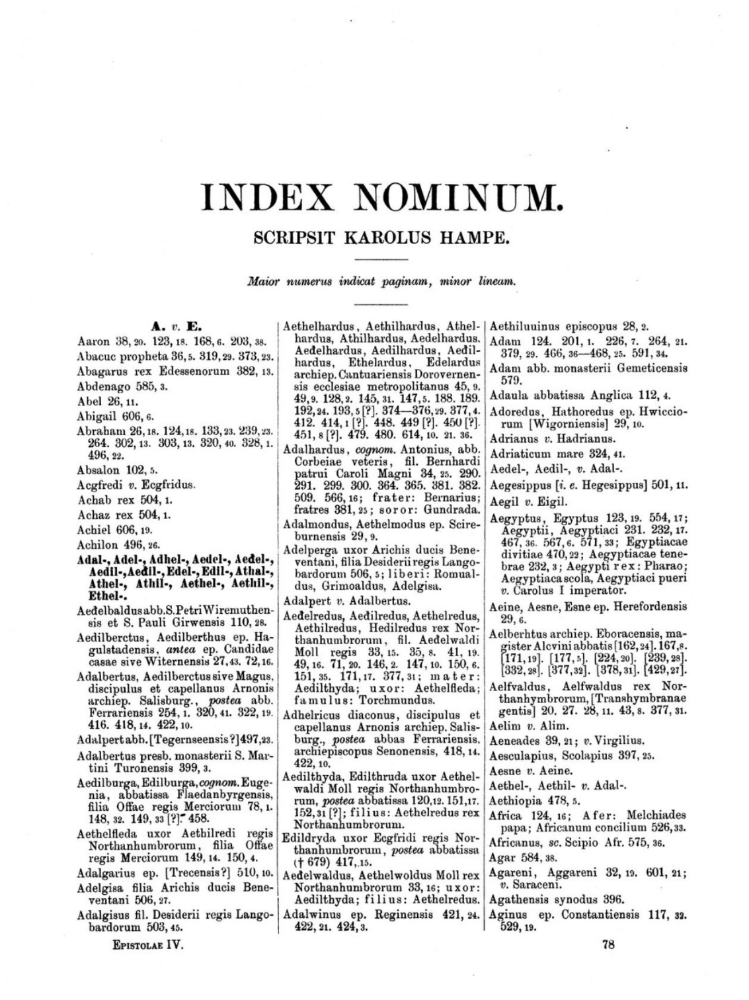

In [50]:
display('Dataset/index_02.jpg')

It is a latin index with multiple columns

In [51]:
image_file = 'Dataset/index_02.jpg'
img = Image.open(image_file)

In [52]:
ocr_result = pytesseract.image_to_string(img)

In [53]:
print(ocr_result)

INDEX NOMINUM.

SCRIPSIT KAROLUS HAMPE.

Maior numerus indicat paginam, minor lineam.

A.v. E.

Aaron 38, 20. 123, 18. 168, 6. 203, 38. |

Abacue propheta 36, 5. 319,29. 373, 23.
Abagarus rex Edessenorum 382, 13.
Abdenago 585, 3.

Abel 26, 11.

Abigail 606, 6.

Abraham 26,18. 124,18. 133, 23, 2:
264. 302, 13. 303, 13. 320, 40. 328, 1.
496, 22.

Absalon 102, 5.

Acgfredi v. Ecgfridus.

Achab rex 504, 1.

Achaz rex 504,1.

Achiel 606, 19.

Achilon 496, 26.

Adal-, Adel-, Adhel-, Aedel-, Aedel-,
‘Aedil-, Aed
Athel-, Athil-, Aethel-, Aethil-
Ethel-.

Aedelbaldusabb.S. Petri Wiremuthen-
sis et S. Pauli Girwensis 110, 28.

Aedilberctus, Aedilberthus ep. Ha-
gulstadensis, antea ep. Candidae
casae sive Witernensis 27,43. 72,16.

Adalbertus, Aedilberctus sive Magus,
discipulus et capellanus Arnonis
archiep. Salisburg., postea_abb.
Ferrariensis 254, 1. 320, 41. 322, 19.
416. 418, 14. 422, 10.

Adalpertabb. [Tegernseensis ?]497,2.

Adalbertus presb. monasterii 8. Mar-
tini Turonensis 399, 3.

Aed

What we see whole page. It is understanding whole page as single column.  
Here, we can make a list of words by  
Separating if letter starts with capital  
split by ','  
strip  
etc.  
Have to do lot of post-processing.    

Instead, we can help pytesseract identify multiple columns then read.  

To understand what is **Kernel**, refer: https://setosa.io/ev/image-kernels/  

### One solution   
We see there are 3 column (boxes) like separated by 2 lines.  
If we read each boxes separately by pytesseract we get better results.  

We use OpenCV, not Pillow for advanced OCR.  
Steps are:  
1. Take original 
2. Gray the image  
3. Blur the text  
4. Use thresh and Otsu  
5. Make a kernel
6. Use kernel and thresh to dilate (here we see no texts but, able to distinguish columns (boxes))

In [54]:
image = cv2.imread('Dataset/index_02.jpg')

In [55]:
# gray the image
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

In [56]:
cv2.imwrite('temp/index_gray.png',gray)

True

In [57]:
# blur the above resulting image
blur = cv2.GaussianBlur(gray, (7,7),0)  #you can change(7,7) to any kernel numbers but it accepts in odd numbers

In [58]:
cv2.imwrite('temp/index_blur.png',blur)

True

In [59]:
# thresh and doing Otsu
thresh = cv2.threshold(blur,0,255,cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)[1]

In [60]:
cv2.imwrite('temp/index_thresh.png',thresh)

True

In [61]:
kernal = cv2.getStructuringElement(cv2.MORPH_RECT,(3,13))        # you can change (3,13) kernel size to blur things here

In [62]:
cv2.imwrite('temp/index_kernal.png',kernal)

True

In [63]:
# Now we dilate
dilate = cv2.dilate(thresh, kernal, iterations=1)

In [64]:
cv2.imwrite('temp/index_dilate.png',dilate)

True

In [65]:
#display('temp/index_dilate.png')
#You can see  text is neglected completely but there is a separation of columns (boxes) 
#which can be identified more easily by the pytesseract.

In [66]:
# we create contours now
cnts = cv2.findContours(dilate, cv2.RETR_EXTERNAL,cv2.CHAIN_APPROX_SIMPLE) #we use dilate image to find contours,take its coordinates and put boxes on original image.

In [67]:
cnts = cnts[0] if len(cnts)==2 else cnts[1]              #need to understand it

In [68]:
#contours are not organized properly, so we do it from left to right.   ???
cnts = sorted(cnts,key=lambda x: cv2.boundingRect(x)[0])

In [69]:
#for c in cnts:      #this iterates over each of the contours which are a bounding box--it has x,y, width, height coordinates
    #x,y,w,h = cv2.boundingRect(c) #collecting the coordinates
    #cv2.rectangle(image, (x,y),(x+w,y+h), (36,255,12),2) # this helps to draw rectangle along the coordinates, (36,255,12) is green for green boxes, 2 is thickness.
    
#cv2.imwrite('temp/index_bbox.png', image)

# it is run in cells below, collecting only bigger boxes.

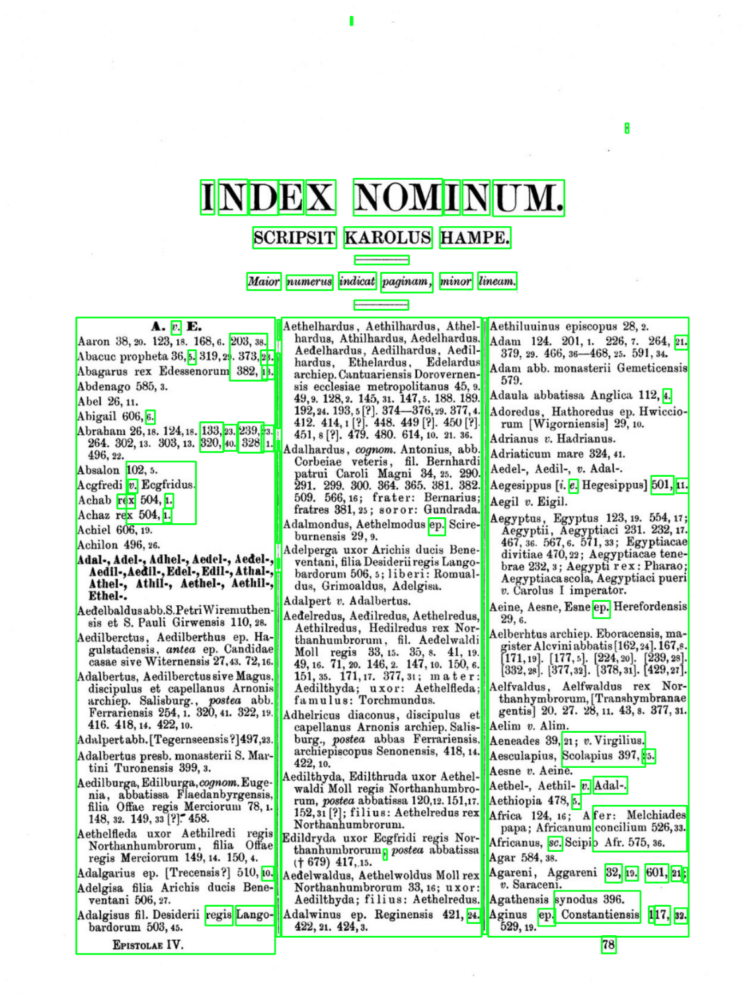

In [106]:
display('temp/index_bbox.png')

# we see contours 3 big boxes and other small boxes also.
# if we can take coordinates of only 3 big boxes by giving some limit(to exclude small boxes) 
# and use this coordinates to crop the image (i.e making multiple columns to a single column)
# read the cropped image 
# better OCR

In [71]:
for c in cnts:      #this iterates over each of the contours which are a bounding box--it has x,y, width, height coordinates
    x,y,w,h = cv2.boundingRect(c) #collecting the coordinates
    if h > 200 and w > 20:            #for eliminating small boxes and collecting bigger box only
        cv2.rectangle(image, (x,y),(x+w,y+h), (36,255,12),2) # this helps to draw rectangle along the coordinates, (36,255,12) is green for green boxes, 2 is thickness.
    
cv2.imwrite('temp/index_bbox_new.png', image)

#restart and run python kernel again, for correct results.    

True

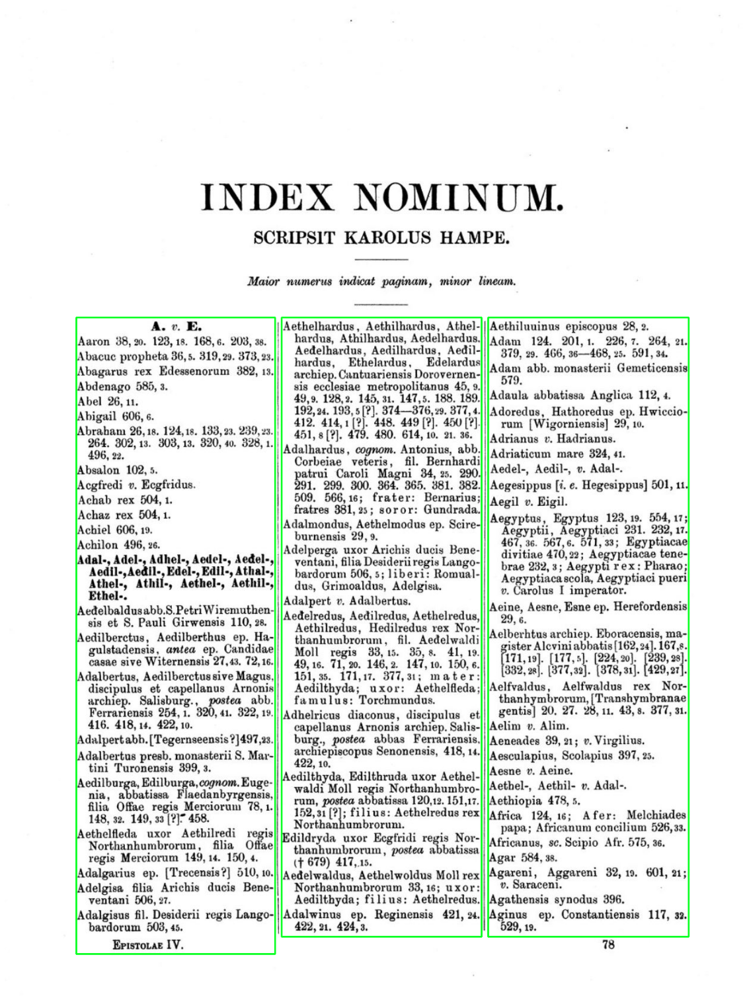

In [107]:
display('temp/index_bbox_new.png')

In [73]:
#now create a roi = region of interest, here we crop the big boxes and read only them separately for better results.

In [74]:
#
#i=0
#from time import sleep
#for c in cnts:
 #   x,y,w,h = cv2.boundingRect(c)
  #  if h > 200 and w > 20:
   #     roi = image[y:y+h,x:x+w]
    #    cv2.imwrite('temp/r{}.png'.format(c[0]),roi)

In [75]:
#cv2.imwrite('temp/p0.png',roi[:,:,0])


In [76]:
#roi[:,:,2]


In [77]:
#cv2.imwrite('temp/p1.png',roi[:,:,1])

In [78]:
#cv2.imwrite('temp/p2.png',roi[:,:,2])

In [85]:
#create a test folder and write in it
#avoid mess
i=0
result=[]
#from time import sleep
for c in cnts:
    x,y,w,h = cv2.boundingRect(c)
    i=i+1
    if h > 200 and w > 20:
        roi = image[y:y+h,x:x+w]
        cv2.imwrite('test/r{}.png'.format(i),roi)          #separating each boxes and saving with diff file name
        ocr_result = pytesseract.image_to_string(roi)
        ocr_result = ocr_result.split('\n')   #separating with new line
        for item in ocr_result:      
            result.append(item)     #storing converted text of all the boxes into one list
            
            

In [81]:
#attempted reading from different boxes, then covert into list for post processing

#img1 = Image.open('test/r1.png')
#ocr_result1 = pytesseract.image_to_string(img1)

In [82]:
#print(ocr_result1)

A. v. E.

Aaron 38, 20. 123, 18. 168, 6. 203, 38.
Abacuc propheta 36,5. 319,29. 373, 23.
Abagarus rex Edessenorum 382, 13.
Abdenago 585, 3.
Abel 26, 11.
Abigail 606, 6.
Abraham 26,18, 124,18. 133, 23.
264. 302, 13. 303, 13. 320, 40.
496, 22.
Absalon 102, 5.
Acgfredi v. Ecgtridus.
Achab rex 504, 1.
Achaz rex 504, 1.
Achiel 606, 19.
Achilon 496, 26.
Adal-, Adel-, Adhel-, Aedel-, Aed

Aedil-, Aedil- Edel-, Edil-, Athal-,
Athel-, Athil-, Aethel-, Aethil-,
Ethel-.
Aedelbaldusabb.S. Petri Wiremuthen-
sis et S. Pauli Girwensis 110, 28.
Aedilberctus, Aedilberthus ep. Ha-
gulstadensis, antea ep. Candidae
casae sive Witernensis 27,43. 72,16.
Adalbertus, Aedilberctus sive Magus,
discipulus et capellanus Arnonis
archiep. Salisburg., postea _abb.
Ferrariensis 254, 1. 320, 41. 322, 19.
416. 418, 14. 422, 10.
Adalpertabb.[Tegernseensis ?]497,23.
Adalbertus presb. monasterii S, Mar-
tini Turonensis 399, 3.
Aedilburga, Edilburga, cognom. Euge-
nia, abbatissa Flaedanbyrgensis,
filia Offae regis Mercioru

In [86]:
print(result)      #list of all the text read by pytesseract

['A. v. E.', '', 'Aaron 38, 20. 123, 18. 168, 6. 203, 38.', 'Abacuc propheta 36,5. 319,29. 373, 23.', 'Abagarus rex Edessenorum 382, 13.', 'Abdenago 585, 3.', 'Abel 26, 11.', 'Abigail 606, 6.', 'Abraham 26,18, 124,18. 133, 23.', '264. 302, 13. 303, 13. 320, 40.', '496, 22.', 'Absalon 102, 5.', 'Acgfredi v. Ecgtridus.', 'Achab rex 504, 1.', 'Achaz rex 504, 1.', 'Achiel 606, 19.', 'Achilon 496, 26.', 'Adal-, Adel-, Adhel-, Aedel-, Aed', '', 'Aedil-, Aedil- Edel-, Edil-, Athal-,', 'Athel-, Athil-, Aethel-, Aethil-,', 'Ethel-.', 'Aedelbaldusabb.S. Petri Wiremuthen-', 'sis et S. Pauli Girwensis 110, 28.', 'Aedilberctus, Aedilberthus ep. Ha-', 'gulstadensis, antea ep. Candidae', 'casae sive Witernensis 27,43. 72,16.', 'Adalbertus, Aedilberctus sive Magus,', 'discipulus et capellanus Arnonis', 'archiep. Salisburg., postea_abb.', 'Ferrariensis 254, 1. 320, 41. 322, 19.', '416. 418, 14. 422, 10.', 'Adalpertabb.[Tegernseensis ?]497,23.', 'Adalbertus presb. monasterii S. Mar-', 'tini Turonensis 3

In [90]:
for item in result:
    item = item.strip().replace('\n','')
    item = item.split(' ')[0]   #collecting only first name or word
    if len(item)>0:   #eliminate just spaces
        if item[0].isupper(): #printing only proper words
            print(item)

A.
Aaron
Abacuc
Abagarus
Abdenago
Abel
Abigail
Abraham
Absalon
Acgfredi
Achab
Achaz
Achiel
Achilon
Adal-,
Aedil-,
Athel-,
Ethel-.
Aedelbaldusabb.S.
Aedilberctus,
Adalbertus,
Ferrariensis
Adalpertabb.[Tegernseensis
Adalbertus
Aedilburga,
Aethelfleda
Northanhumbrorum,
Adalgarius
Adelgisa
Adalgisus
Epistozae
Aethelhardus,
Aedelhardus,
Adalhardus,
Corbeiae
Adalmondus,
Adelperga
Adalpert
Aedelredus,
Aethilredus,
Moll
Aedilthyda;
Adhelricus
Aedilthyda,
Northanhumbrorum.
Edildryda
Aedelwaldus,
Northanhumbrorum
Aedilthyda;
Adalwinus
Aethiluuinus
Adam
Adam
Adaula
Adoredus,
Adrianus
Adriaticum
Aedel-,
Aegesippus
Aegil
Aegyptus,
Aegyptii,
Aegyptiacascola,
Aeine,
Aelberhtus
Aelfvaldus,
Aelim
Aeneades
Aesculapius,
Aesne
Aethel-,
Aethiopia
Africa
Africanus,
Agar
Agareni,
Agathensis
Aginus


In [98]:
# we can do this in above step itself but just to know thinking process, I am doing it here
entities=[]
for item in result:
    item = item.strip().replace('\n','')
    item = item.split(' ')[0]   #collecting only first name or word
    if len(item)>2:
        if item[0]=='A' and '-' not in item:
            item = item.split('.')[0].replace(',','').replace(';','')
            #print(item)
            entities.append(item)

In [99]:
print(entities)       #here we have duplicates

['Aaron', 'Abacuc', 'Abagarus', 'Abdenago', 'Abel', 'Abigail', 'Abraham', 'Absalon', 'Acgfredi', 'Achab', 'Achaz', 'Achiel', 'Achilon', 'Aedelbaldusabb', 'Aedilberctus', 'Adalbertus', 'Adalpertabb', 'Adalbertus', 'Aedilburga', 'Aethelfleda', 'Adalgarius', 'Adelgisa', 'Adalgisus', 'Aethelhardus', 'Aedelhardus', 'Adalhardus', 'Adalmondus', 'Adelperga', 'Adalpert', 'Aedelredus', 'Aethilredus', 'Aedilthyda', 'Adhelricus', 'Aedilthyda', 'Aedelwaldus', 'Aedilthyda', 'Adalwinus', 'Aethiluuinus', 'Adam', 'Adam', 'Adaula', 'Adoredus', 'Adrianus', 'Adriaticum', 'Aegesippus', 'Aegil', 'Aegyptus', 'Aegyptii', 'Aegyptiacascola', 'Aeine', 'Aelberhtus', 'Aelfvaldus', 'Aelim', 'Aeneades', 'Aesculapius', 'Aesne', 'Aethiopia', 'Africa', 'Africanus', 'Agar', 'Agareni', 'Agathensis', 'Aginus']


In [100]:
entities=list(set(entities))

In [105]:
print(entities)

['Aaron', 'Abacuc', 'Abagarus', 'Abdenago', 'Abel', 'Abigail', 'Abraham', 'Absalon', 'Acgfredi', 'Achab', 'Achaz', 'Achiel', 'Achilon', 'Adalbertus', 'Adalgarius', 'Adalgisus', 'Adalhardus', 'Adalmondus', 'Adalpert', 'Adalpertabb', 'Adalwinus', 'Adam', 'Adaula', 'Adelgisa', 'Adelperga', 'Adhelricus', 'Adoredus', 'Adrianus', 'Adriaticum', 'Aedelbaldusabb', 'Aedelhardus', 'Aedelredus', 'Aedelwaldus', 'Aedilberctus', 'Aedilburga', 'Aedilthyda', 'Aegesippus', 'Aegil', 'Aegyptiacascola', 'Aegyptii', 'Aegyptus', 'Aeine', 'Aelberhtus', 'Aelfvaldus', 'Aelim', 'Aeneades', 'Aesculapius', 'Aesne', 'Aethelfleda', 'Aethelhardus', 'Aethilredus', 'Aethiluuinus', 'Aethiopia', 'Africa', 'Africanus', 'Agar', 'Agareni', 'Agathensis', 'Aginus']


In [103]:
entities.sort()

In [104]:
print(entities)

['Aaron', 'Abacuc', 'Abagarus', 'Abdenago', 'Abel', 'Abigail', 'Abraham', 'Absalon', 'Acgfredi', 'Achab', 'Achaz', 'Achiel', 'Achilon', 'Adalbertus', 'Adalgarius', 'Adalgisus', 'Adalhardus', 'Adalmondus', 'Adalpert', 'Adalpertabb', 'Adalwinus', 'Adam', 'Adaula', 'Adelgisa', 'Adelperga', 'Adhelricus', 'Adoredus', 'Adrianus', 'Adriaticum', 'Aedelbaldusabb', 'Aedelhardus', 'Aedelredus', 'Aedelwaldus', 'Aedilberctus', 'Aedilburga', 'Aedilthyda', 'Aegesippus', 'Aegil', 'Aegyptiacascola', 'Aegyptii', 'Aegyptus', 'Aeine', 'Aelberhtus', 'Aelfvaldus', 'Aelim', 'Aeneades', 'Aesculapius', 'Aesne', 'Aethelfleda', 'Aethelhardus', 'Aethilredus', 'Aethiluuinus', 'Aethiopia', 'Africa', 'Africanus', 'Agar', 'Agareni', 'Agathensis', 'Aginus']


So we took an Index page image,  
read it in python  
separated as 3 big boxes  
read those boxes only and stored in a list  
did post processing for correct text.
